### import numpy as np
import math
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
f1 = np.loadtxt('noquench_Equildata_L64_Temp1.000000.dat')
conf1 = np.loadtxt('noquench_sweepspinconf_L64_tfinal1.000000.dat')


In [3]:
class vis():
    ### initializing the object for a given system size L and system parameters
    def __init__(self,f_Eq,conf_theta):
        self.L = (int)(np.sqrt(conf1.shape[1]-1))
        self.n_sites = self.L*self.L
        self.f_Eq = f_Eq
        self.conf_theta = conf_theta 
        self.winding_num=[]

    ### spatial image of a theta configuration
    def spatial_imag(self,intp='none',t=0):
        img = np.array(self.conf_theta[t,1:].reshape(self.L,self.L))
        plt.imshow(img,origin='lower',interpolation=intp,cmap='Paired')
        plt.xticks([])
        plt.yticks([])
        plt.colorbar()
        plt.show()

    ### calculating neighbours of the spins
    def neighbour(self):
        tempr = []
        templ = []
        tempu = []
        tempd = []
        for i in range(self.n_sites):
            xi = i % (self.L)
            yi = i//(self.L)
            tempr.append(((xi+1) % self.L + yi*self.L))
            templ.append(((xi-1+self.L) % self.L + yi*self.L))
            tempu.append((xi+((yi+1) % self.L)*self.L))
            tempd.append((xi + ((yi-1+self.L) % self.L)*self.L))
        self.right = tempr
        self.left = templ
        self.up = tempu
        self.down = tempd
    
    ### time series of enrgy and magnetisation as an observable 
    def plot_timeseries(self):
        fig,ax1 = plt.subplots()
        color='tab:red'
        ax1.plot(self.f_Eq[:,1],color=color)
        ax1.set_ylabel('Energy',color=color,fontsize=16)
        ax1.set_xlabel('Monte Carlo Steps',fontsize=16)
        ax1.tick_params(axis='y',labelcolor=color,labelsize=14)
        ax1.tick_params(axis='x',labelsize=14)
        ax2 = ax1.twinx()

        color='tab:green'
        ax2.plot(self.f_Eq[:,4],color=color)
        ax2.set_ylabel('Magnetisation',color=color,fontsize=16)
        ax2.tick_params(axis='y',labelcolor=color,labelsize=14)

        plt.show()
    
    ### time series of only one of the observable
    def oneob_timeseries(self,enr=0):
        fig,ax1 = plt.subplots()
        color='tab:red'
        if enr==1:
            ax1.plot(self.f_Eq[:,1],color=color)
            ax1.set_ylabel('Energy',color=color,fontsize=16)
            ax1.set_xlabel('Monte Carlo Steps',fontsize=16)
            ax1.tick_params(axis='y',labelcolor=color,labelsize=14)
            ax1.tick_params(axis='x',labelsize=14)
        else:
            ax1.plot(self.f_Eq[:,4],color=color)
            ax1.set_ylabel('Magnetisation',color=color,fontsize=16)
            ax1.set_xlabel('Monte Carlo Steps',fontsize=16)
            ax1.tick_params(axis='y',labelcolor=color,labelsize=14)
            ax1.tick_params(axis='x',labelsize=14)
       
        plt.show()

                       

    ### to plot the angles of the system 
    def angle_plot_arrow(self,lattfig_flag=0,wnd_flag=0,t=0):
        self.uvec = list(map(lambda x:np.cos(x),self.conf_theta[t,1:]))
        self.vvec = list(map(lambda x: np.sin(x), self.conf_theta[t,1:]))
        self.xind = list(map(lambda x:x%self.L,np.arange(self.L**2)))
        self.yind = list(map(lambda x:x//self.L,np.arange(self.L**2)))
        self.xvortex = np.array(self.xind) + 0.5
        self.yvortex = np.array(self.yind) + 0.5

        fig,ax=plt.subplots(figsize=(10,10))
        #plt.quiver(self.xind,self.yind,self.uvec,self.vvec,self.site_theta,units='xy',angles='xy'\
        #               ,scale=1.1,width=0.3,headwidth=1.3,headlength=3.5,cmap=cmap)
        plt.quiver(self.xind,self.yind,self.uvec,self.vvec,units='xy',angles='xy'\
                       ,scale=1.,width=0.3,headwidth=1.0,headlength=4.0)
        if lattfig_flag==1:
            ims = np.array(self.conf_theta[t,1:]).reshape(self.L, self.L)
            plt.imshow(ims,origin='lower',cmap='RdBu',alpha=0.6,interpolation='bicubic')
            #plt.colorbar()
        if wnd_flag==1:
            ims = np.array(self.winding_num).reshape(self.L,self.L)
            plt.imshow(ims,origin='lower',cmap='RdBu',interpolation='spline36')
         #   plt.imshow(ims,origin='lower',cmap='RdBu',alpha=0.8)
         #   plt.scatter(self.xvortex,self.yvortex,s=self.winding_num)
            #plt.show()
            plt.colorbar(shrink=0.8)
        
        plt.axis([-1,self.L,-1,self.L])
        plt.xticks([])
        plt.yticks([])
        ax.spines['top'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        plt.show()

    ### this function will calculate the mod of the number applicable for both
    ### positive and negatice number.
    ### the positive number is closed at pi and negative at -pi
    def calc_modulus(self,x):
        if x<0:
            return (-1)*((abs(x))%(np.pi))
        else:
            return x%(np.pi)
    
    ### this function will first normalize theta such that they are in the range [-pi,pi]
    ### then the phase winding is calculated also taking into account that the difference can 
    ### only lie in the range.
    def windcalculation(self,t=0):
        self.winding_num=[]
        temp = self.conf_theta[t,1:]
        for i in range(self.n_sites):
            ri = self.right[i]
            li = self.left[i]
            ui = self.up[i]
            di = self.down[i]
            
#            w21 = self.calc_modulus(self.conf_theta[ri,1] - self.conf_theta[i,1])
#            w32 = self.calc_modulus(self.conf_theta[uri,1] - self.conf_theta[ri,1])
#            w43 = self.calc_modulus(self.conf_theta[ui,1] - self.conf_theta[uri,1])
#            w14 = self.calc_modulus(self.conf_theta[i,1] - self.conf_theta[ui,1])

            w1r = self.calc_modulus(temp[i] - temp[ri])
            w1l = self.calc_modulus(temp[i] - temp[li])
            w1u = self.calc_modulus(temp[i] - temp[ui])
            w1d = self.calc_modulus(temp[i] - temp[di])
#            self.winding_num.append((w21+w32+w43+w14)/(2.*np.pi))
            self.winding_num.append((w1r+w1l+w1u+w1d)/(2*np.pi))


### Creating the object 
* $T = 0.5$

In [4]:
fig_obj = vis(f1,conf1)
fig_obj.neighbour()
fig_obj.windcalculation()

* Plotting the time series for the  energy and magnetization for different monte carlo steps.
* Below are the results for both energy and magnetization individually

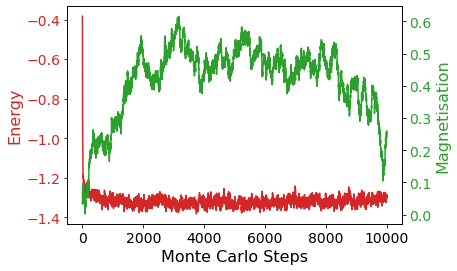

In [5]:
fig_obj.plot_timeseries()



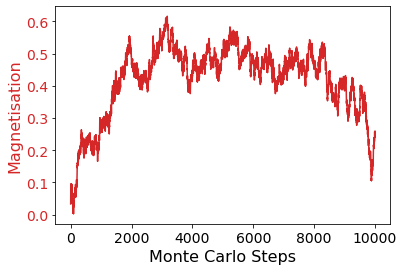

In [7]:
fig_obj.oneob_timeseries(enr=0)

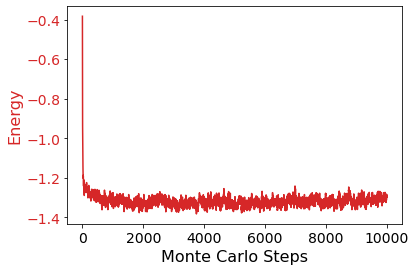

In [8]:
fig_obj.oneob_timeseries(enr=1)

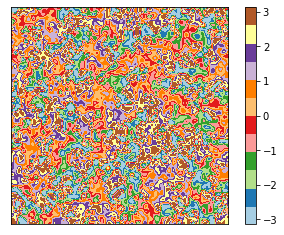

In [11]:
fig_obj.spatial_imag(t=10,intp='spline36')


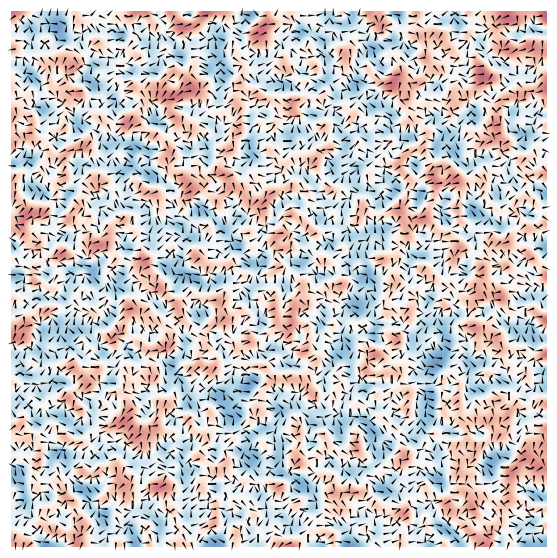

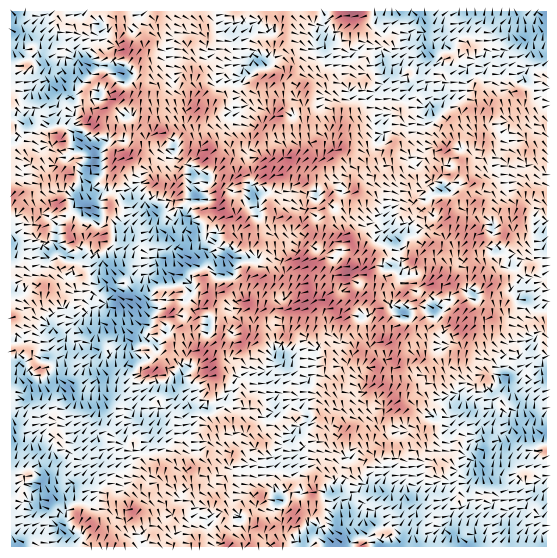

In [14]:
fig_obj.angle_plot_arrow(lattfig_flag=1,wnd_flag=0,t=0)
fig_obj.angle_plot_arrow(lattfig_flag=1,wnd_flag=0,t=1000)



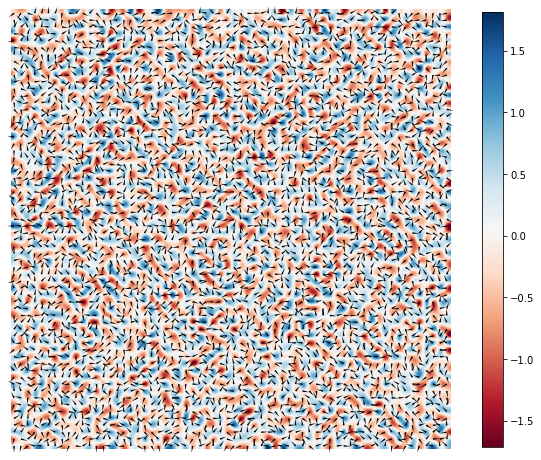

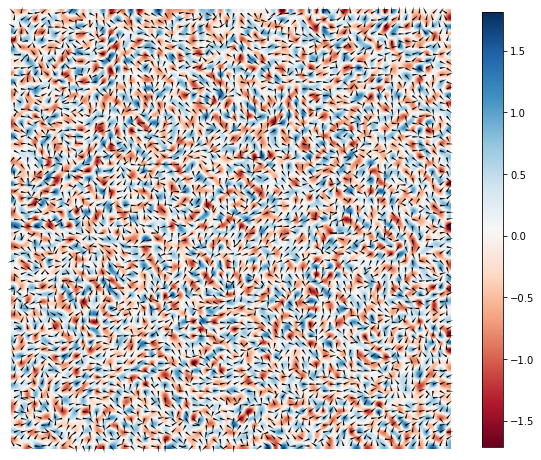

In [17]:
fig_obj.angle_plot_arrow(lattfig_flag=0,wnd_flag=1,t=0)
fig_obj.angle_plot_arrow(lattfig_flag=0,wnd_flag=1,t=1000)


In [126]:
f1 = np.loadtxt('Equildata_L16_Temp1.000000.dat')
conf1 = np.loadtxt('spinconf_L16_tfinal1.000000.dat')


In [127]:
fig_obj2 = vis(f1,conf1)
fig_obj2.neighbour()
fig_obj2.windcalculation()

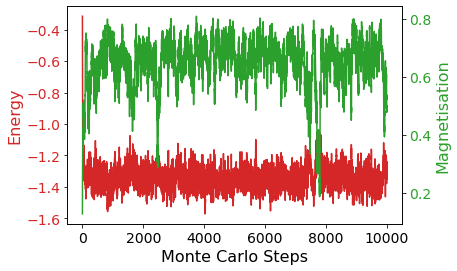

In [128]:
fig_obj2.plot_timeseries()

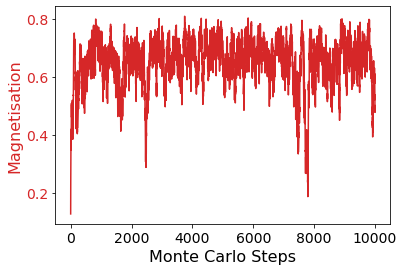

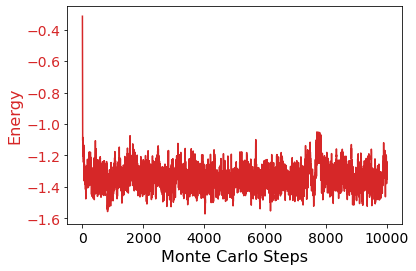

In [129]:
fig_obj2.oneob_timeseries(enr=0)
fig_obj2.oneob_timeseries(enr=1)

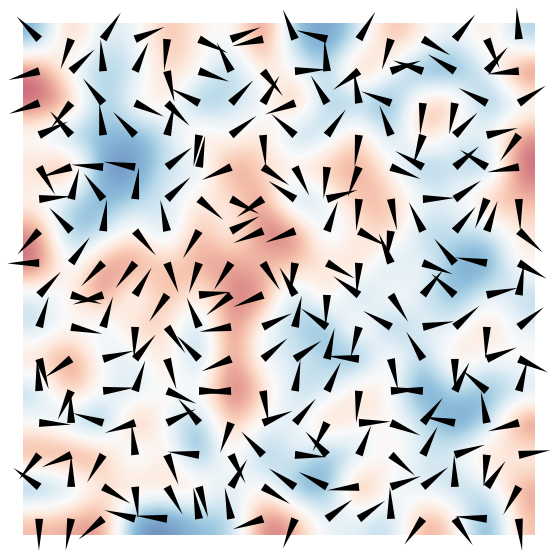

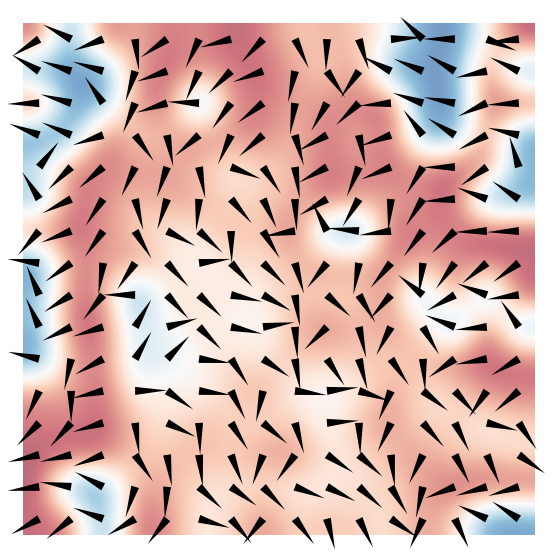

In [130]:
fig_obj2.angle_plot_arrow(lattfig_flag=1,wnd_flag=0,t=0)
fig_obj2.angle_plot_arrow(lattfig_flag=1,wnd_flag=0,t=1)



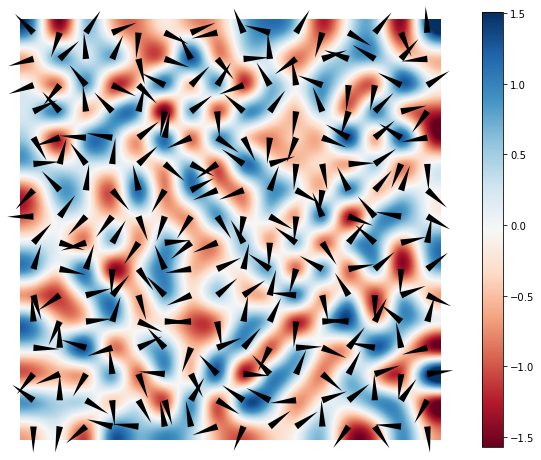

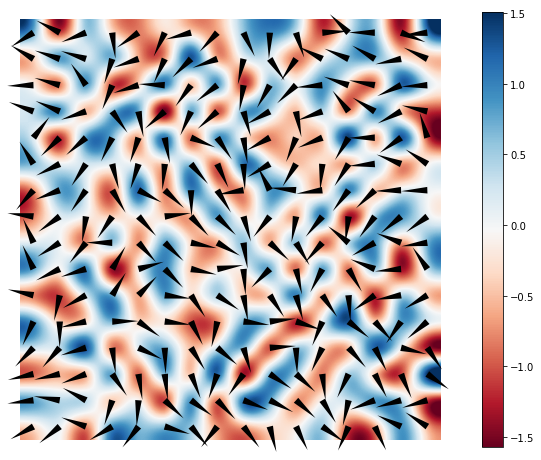

In [131]:
fig_obj2.angle_plot_arrow(lattfig_flag=0,wnd_flag=1,t=0)
fig_obj2.angle_plot_arrow(lattfig_flag=0,wnd_flag=1,t=1)


In [132]:
f1 = np.loadtxt('Equildata_L64_Temp1.000000.dat')
conf1 = np.loadtxt('spinconf_L64_tfinal1.000000.dat')


In [133]:
fig_obj3 = vis(f1,conf1)
fig_obj3.neighbour()
fig_obj3.windcalculation()

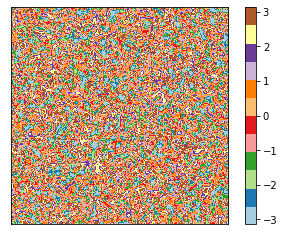

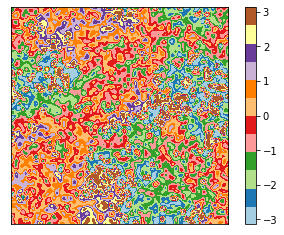

In [139]:
fig_obj3.spatial_imag(intp='spline36',t=0)
fig_obj3.spatial_imag(intp='spline36',t=1)


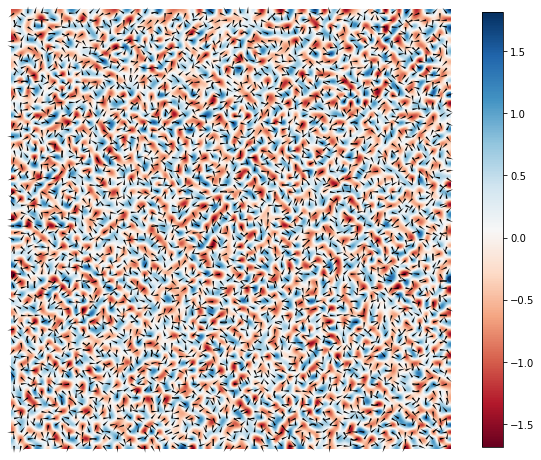

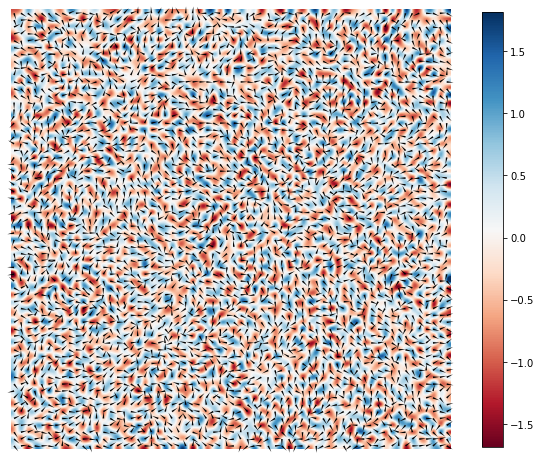

In [134]:
fig_obj3.angle_plot_arrow(lattfig_flag=0,wnd_flag=1,t=0)
fig_obj3.angle_plot_arrow(lattfig_flag=0,wnd_flag=1,t=1)


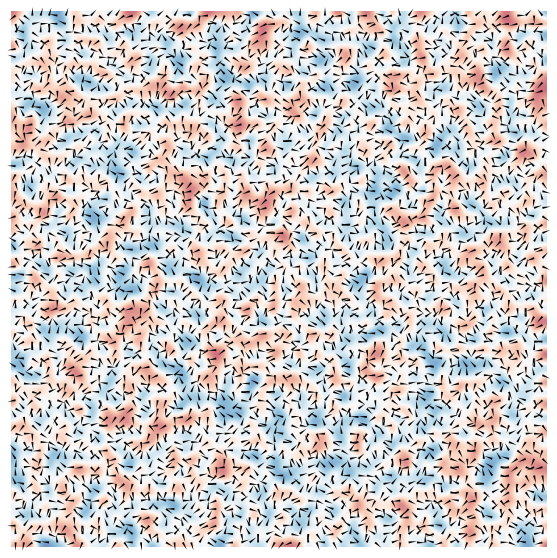

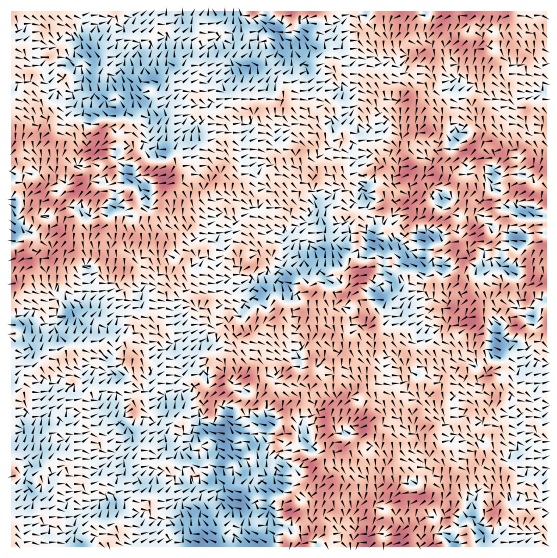

In [135]:
fig_obj3.angle_plot_arrow(lattfig_flag=1,wnd_flag=0,t=0)
fig_obj3.angle_plot_arrow(lattfig_flag=1,wnd_flag=0,t=1)


There is a tab at the end of the file so when loading it the last column will show the Nan. This can be ignored by using the iloc.

### Details
#### For the infintely random quench.
1. Start with random initial state (save the initial configuration).
1. Generate new configurations ($t:  0 \rightarrow 2050$ with time step 1)


In [47]:
#conf1 = pd.read_csv('noquench_sweepspinconf_L64_tfinal1.000000.dat',sep='\t',header=None)
conf1 = pd.read_csv('linearquench_sweepspinconf_L64.dat',sep='\t',header=None)

cnfs,dims=conf1.shape
col_name = []
col_name.append('time')
col_name.extend([f'theta{i}'  for i in range(dims-1)])

conf1.columns = col_name
conf1.drop(col_name[-1], axis=1,inplace=True)
display(conf1.head())
conf1  = np.array(conf1.iloc[:,1:]).reshape(cnfs,int(np.sqrt(dims-2)),int(np.sqrt(dims-2)))



,time,theta0,theta1,theta2,theta3,theta4,theta5,theta6,theta7,theta8,...,theta4086,theta4087,theta4088,theta4089,theta4090,theta4091,theta4092,theta4093,theta4094,theta4095
0,1.780000,-0.27826,0.051013,-2.127571,2.264784,-1.878944,2.464278,1.760516,2.528168,1.931745,...,-3.096709,-2.313433,1.181036,-0.669940,-1.072663,-0.594180,-0.343809,-0.841201,0.900935,-0.161925
1,1.779131,-0.27826,0.051013,-2.127571,-1.427874,-1.878944,2.464278,1.760516,2.528168,-0.750462,...,-1.034186,-2.313433,1.181036,-0.669940,-1.072663,-0.027007,-0.343809,2.819738,-2.364992,-0.161925
2,1.778262,-0.27826,0.628724,-2.127571,3.118055,-1.878944,2.464278,1.760516,2.528168,-2.992844,...,-2.494378,-2.313433,-2.620094,-0.669940,-1.072663,-0.027007,-0.343809,1.022179,-2.364992,-0.161925
3,1.777393,-0.27826,0.628724,-2.127571,-2.054529,2.269415,-2.429668,0.891453,2.528168,-2.992844,...,-2.494378,-2.128271,-2.620094,0.624975,-1.072663,-1.988435,1.558536,1.535474,-2.364992,-0.161925
4,1.776523,-0.27826,0.628724,0.025573,1.786202,2.269415,-2.414153,0.891453,2.528168,-2.992844,...,0.656521,-0.981210,-2.620094,0.624975,-0.642143,1.688555,1.558536,1.535474,1.380430,-0.161925


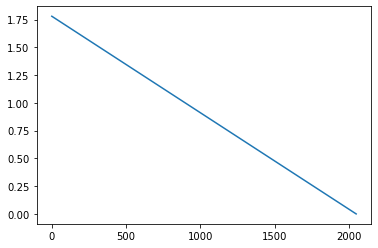

In [43]:
conf1.time.plot()
plt.show()

In [44]:
conf1.time.describe()

count    2049.000000
mean        0.890000
std         0.514218
min         0.000000
25%         0.445000
50%         0.890000
75%         1.335000
max         1.780000
Name: time, dtype: float64

In [ ]:
import plotly.express as px
fig = px.imshow(conf1,animation_frame=0,
                color_continuous_scale='sunset', origin='lower')

fig.show()


In [35]:

import dash
import dash_core_components as  dcc
import dash_html_components as html
app = dash.Dash()
app.layout=html.Div([
    dcc.Graph(figure=fig)
])
app.run_server(debug=True,use_reloader=False)

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app '__main__' (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: on


| | | | | | | 
|--|--|--|--|--|--|
| 3 | 0 | 1 | 2 | 3 | 0 | 
| 15 | 12 | 13 | 14 | 15 | 12 |
| 11 | 8 | 9 | 10 | 11| 8 |
| 7 | 4 | 5 | 6 | 7 | 4 | 
| 3 | 0 | 1 | 2 | 3 | 0 | 
| 15 | 12 | 13 | 14 | 15 | 12 |

In [26]:
import seaborn as sns
from matplotlib.colors import ListedColormap
L = 6
temp = np.array([i for i in range(L**2)]).reshape(L,L)
xi = []
for j in range(temp.shape[0]):
    xi.extend(temp[(L-1)-j,:])

In [27]:
xi = np.array(xi).reshape(L,L)

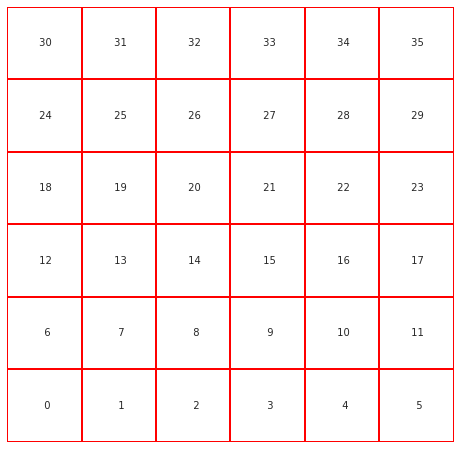

In [28]:
f=plt.figure(figsize=(8,8))
sns.heatmap(xi,annot=True,fmt='3d',cmap=ListedColormap(['white']),
            linecolor='red',linewidths=1,cbar=False,square=False)
plt.xticks([])
plt.yticks([])

plt.show()

In [2]:
import matplotlib.pyplot as plt
import numpy as np 
import pandas as pd
import plotly.express as ps
n_r = 10000
m_x=np.random.uniform(-1,1,n_r)
m_y=np.random.uniform(-1,1,n_r)
m_z=np.random.uniform(-1,1,n_r)
for j in range(n_r):
    norm_m = m_x[j]**2 + m_y[j]**2 + m_z[j]**2
    if norm_m>0.001:
        m_x[j] = m_x[j]/np.sqrt(norm_m)
        m_y[j] = m_y[j]/np.sqrt(norm_m)
        m_z[j] = m_z[j]/np.sqrt(norm_m)


In [2]:
data = pd.DataFrame({'mx':m_x,'my':m_y,'mz':m_z,'size':m_x})

In [3]:
ps.scatter_3d(data,x='mx',y='my',z='mz')

| | | |  | |
|:--|:--|:---|:--|:--|
| 2 | 0 | 1 | 2 | 0 |
| 8 | 6 | 7 | 8 | 6 |
| 5 | 3 | 4 | 5 | 3 |
| 2 | 0 | 1 | 2 | 0 | 
| 8 | 6 | 7 | 8 | 6 |


In [1]:
 import numpy as np
 import math
 import matplotlib.pyplot as plt
 import pandas as pd

In [9]:
n_r=10000
ri=np.random.uniform(0,2,n_r)
ui=np.random.uniform(0,1,n_r)
vi=np.random.uniform(0,1,n_r)



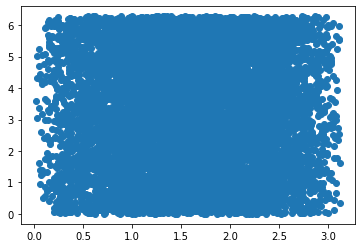

In [10]:
theta=np.arccos(2*vi-1.0)
phi =2*np.pi*ui
plt.scatter(theta, phi)
plt.show()


In [16]:
xi=[];yi=[];zi=[]
xi_2=[];yi_2=[];zi_2=[]
for j in range(n_r):
    xi.append(ri[j]*np.cos(theta[j])  * np.sin(phi[j]))
    yi.append(ri[j]*np.sin(theta[j])  * np.sin(phi[j]))
    zi.append(ri[j]* np.cos(phi[j]))
    #xi_2.append(np.cos(theta[j]) * np.sin(phi[j]))
    #yi_2.append(np.sin(theta[j]) * np.sin(phi[j]))
    #zi_2.append(np.cos(phi[j]))
#xi.extend(xi_2)
#yi.extend(yi_2)
#zi.extend(zi_2)
#size=[[i for j in range(n_r)]  for i in [0,1]]
data = pd.DataFrame({'x': ri, 'y': theta, 'z': phi})#,'size_d':np.array(size).flatten()})



In [17]:
data.describe()

,x,y,z
count,10000.000000,10000.000000,10000.000000
mean,0.994656,1.577728,3.144648
std,0.577924,0.682359,1.816770
min,0.000586,0.014768,0.001032
25%,0.496211,1.057042,1.574061
50%,0.993862,1.571610,3.116945
75%,1.495171,2.105730,4.752182
max,1.999903,3.122710,6.283118


In [124]:
import plotly.express as px
fig = px.scatter_3d(data, x='x', y='y', z='z', size='size_d',color='size_d')
fig.show()

data.size_d.max()

1

In [1]:
import plotly.express as px
import xarray as xr
# Load xarray from dataset included in the xarray tutorial
ds = xr.tutorial.open_dataset('air_temperature').air[:20]
fig = px.imshow(ds, animation_frame='time', zmin=220,
                zmax=300, color_continuous_scale='RdBu_r')
fig.show()

In [10]:
import pandas as pd
import numpy as np

In [12]:
data = pd.read_csv('configurations_L24_temp0.010000_Uint2.000',sep='\t',header=None)


,0
0,10 0 9.87631408E-01 6....
1,10 1 9.89129949E-01 5....
2,10 2 9.96512282E-01 2....
3,10 3 9.96738089E-01 3....
4,10 4 9.86200236E-01 4....
...,...
115195,2000 571 9.98615176E-01 2....
115196,2000 572 9.95281616E-01 6....
115197,2000 573 9.57641485E-01 8....
115198,2000 574 9.86192588E-01 6....
